In [1]:
import numpy as np
import pandas as pd
from itertools import combinations

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap as LSCM
from mpl_toolkits import mplot3d
import seaborn as sns
import plotly.express as px

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
sns.set_style("white")

### Plotting functions

In [4]:
def get_mdf(method, n_components, df, features, target):
    if method=='pca':
        model = PCA(n_components=n_components)
    else:
        model = TSNE(n_components=n_components)
    
    points = pd.DataFrame(model.fit_transform(df[features]),
                          columns=[f'{method}-component-{each+1}' for each in range(n_components)])
    points[target] = df[target]
    return points

In [5]:
def plot_2d(method, mdf, target, dataset_name, palette='plasma'):
    sns.scatterplot(mdf, x=f'{method}-component-1', y=f'{method}-component-2',
                    hue=target, palette=palette)
    if method == 'pca':
        plt.title(f'PCA (2D) Visualization for {dataset_name} Dataset')
    else:
        plt.title(f't-SNE (2D) Visualization for {dataset_name} Dataset')
    plt.show()

In [6]:
def plot_interactive(method, n_components, df, mdf, features, target, dataset_name):
    temp = df.copy()
    temp[f'{method}-component-1'] = mdf[f'{method}-component-1']
    temp[f'{method}-component-2'] = mdf[f'{method}-component-2']
    method_name = 'PCA' if method == 'pca' else 't-SNE'
    if n_components == 2:
        fig = px.scatter(temp, x=f'{method}-component-1', y=f'{method}-component-2',
                         color=target, hover_data=features, width=800, height=500,
                         title=f'Interactive {method_name} (2D) Visualization for {dataset_name} Dataset')
    else:
        temp[f'{method}-component-3'] = mdf[f'{method}-component-3']
        fig = px.scatter_3d(temp, x=f'{method}-component-1', y=f'{method}-component-2', z=f'{method}-component-3',
                            color=target, hover_data=features, width=800, height=500,
                            title=f'Interactive {method_name} (3D) Visualization for {dataset_name} Dataset')
    
    fig.show()

---
# Iris Dataset
---

### Exploratory Data Analysis

In [7]:
iris_df = pd.read_csv('iris.csv')
iris_df.head()

,sepal_length,sepal_width,petal_length,petal_width,label
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


In [8]:
iris_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sepal_length  150 non-null    float64
 1   sepal_width   150 non-null    float64
 2   petal_length  150 non-null    float64
 3   petal_width   150 non-null    float64
 4   label         150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


In [9]:
iris_df.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [10]:
iris_df.isnull().sum()

sepal_length    0
sepal_width     0
petal_length    0
petal_width     0
label           0
dtype: int64

In [11]:
iris_features = iris_df.columns.tolist()[:-1]

In [12]:
iris_df.label.unique()

array(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], dtype=object)

In [13]:
iris_df.label.value_counts()

label
Iris-setosa        50
Iris-versicolor    50
Iris-virginica     50
Name: count, dtype: int64

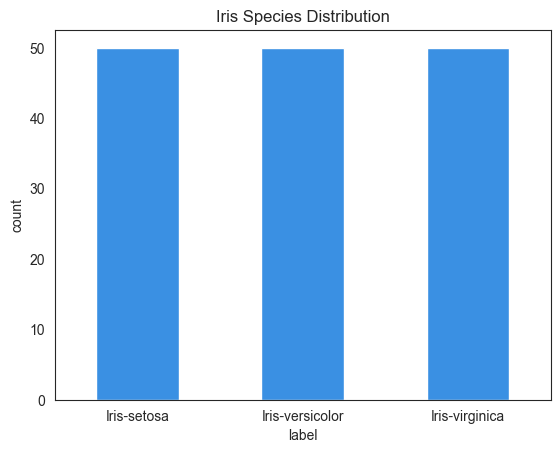

In [14]:
sns.countplot(x='label', data=iris_df, color='dodgerblue', width=0.5)
plt.title('Iris Species Distribution')
plt.show()

In [15]:
def label_iris(x):
    if x == 'Iris-setosa':
        return 0
    elif x == 'Iris-versicolor':
        return 1
    return 2

### Plotting all feature pairs

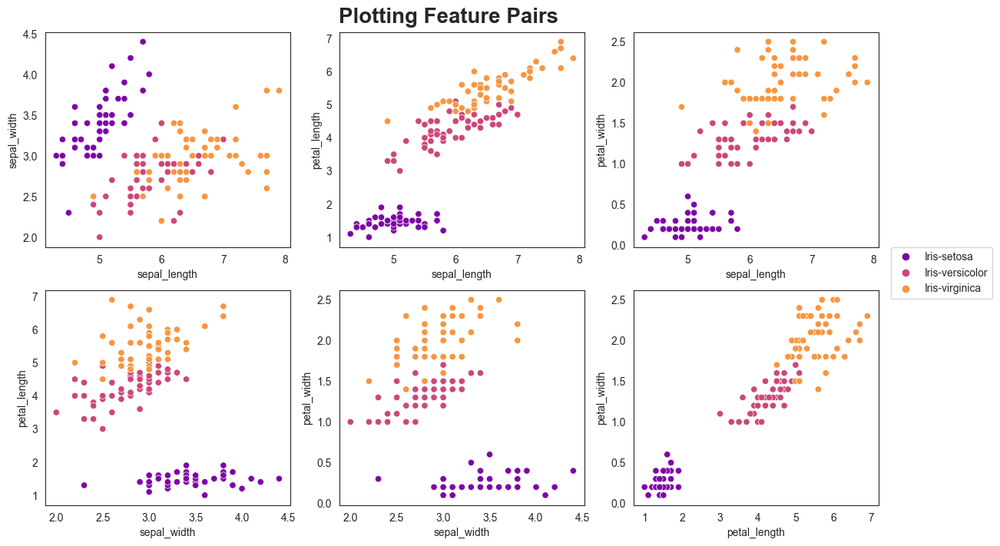

In [16]:
fig, ax = plt.subplots(2, 3, figsize=(14,8))

for idx, pair in enumerate(combinations(iris_features, 2)):
    sns.scatterplot(iris_df, x=pair[0], y=pair[1], hue='label', palette='plasma', ax=ax[idx//3][idx%3], legend=True if idx==5 else False)
    if idx == 5:
        ax[idx//3][idx%3].legend(bbox_to_anchor=(1.05, 1.2), loc='upper left', borderaxespad=0)

fig.suptitle('Plotting Feature Pairs', fontsize=20, fontweight='bold', y=0.92)
fig.show()

## PCA (2D) Visualizations

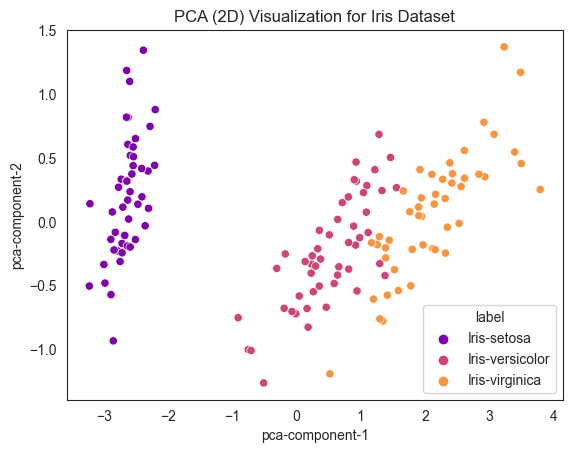

In [17]:
points = get_mdf(method='pca', n_components=2, df=iris_df, features=iris_features, target='label')
plot_2d(method='pca', mdf=points, target='label', dataset_name='Iris', palette='plasma')

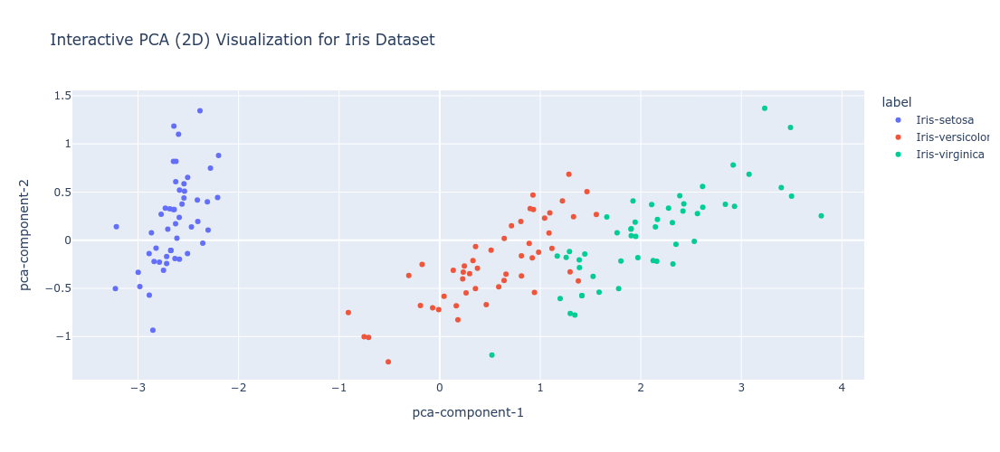

In [18]:
plot_interactive(method='pca', n_components=2, df=iris_df, mdf=points,
                 features=iris_features, target='label', dataset_name='Iris')

## PCA (3D) Visualizations

In [19]:
points = get_mdf(method='pca', n_components=3, df=iris_df, features=iris_features, target='label')
points['label'] = list(map(label_iris, iris_df.label))

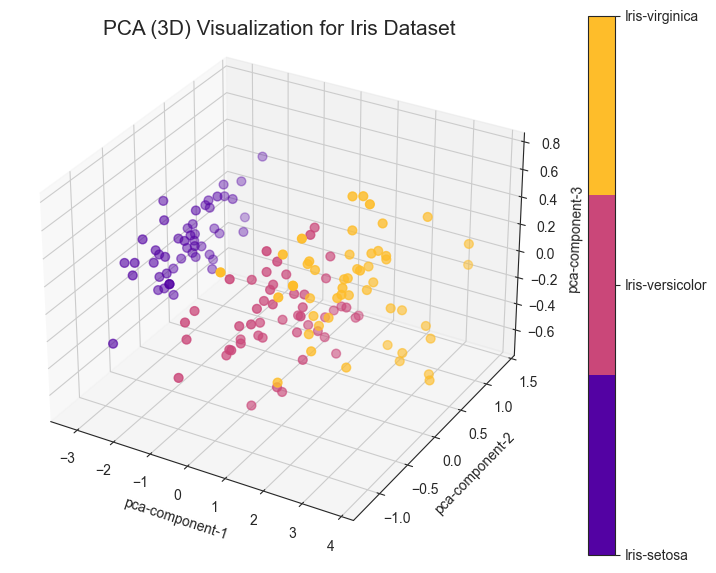

In [20]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes(projection='3d')

p = ax.scatter3D(points['pca-component-1'],
             points['pca-component-2'],
             points['pca-component-3'], 
             c=points.label, cmap=LSCM.from_list("colormap", sns.color_palette('plasma'), N=3), s=40)

ax.set_title('PCA (3D) Visualization for Iris Dataset', fontsize=15, y=1.03)

ax.set_xlabel("pca-component-1")
ax.set_ylabel("pca-component-2")
ax.set_zlabel("pca-component-3")

cbar = fig.colorbar(p)
cbar.set_ticklabels(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'])
cbar.set_ticks([0,1,2])
plt.show()

In [21]:
plot_interactive(method='pca', n_components=3, df=iris_df, mdf=points,
                 features=iris_features, target='label', dataset_name='Iris')

## t-SNE (2D) Visualizations

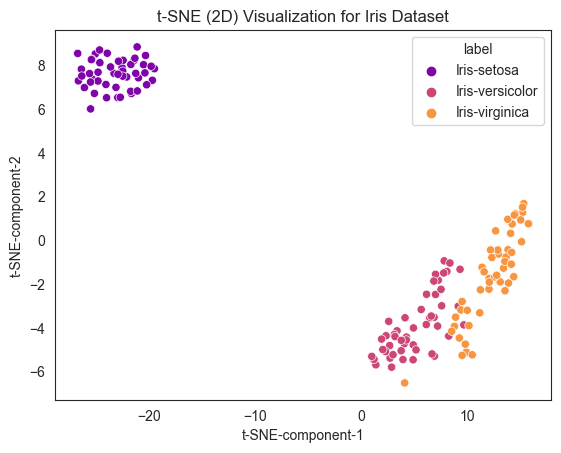

In [22]:
points = get_mdf(method='t-SNE', n_components=2, df=iris_df, features=iris_features, target='label')
plot_2d(method='t-SNE', mdf=points, target='label', dataset_name='Iris', palette='plasma')

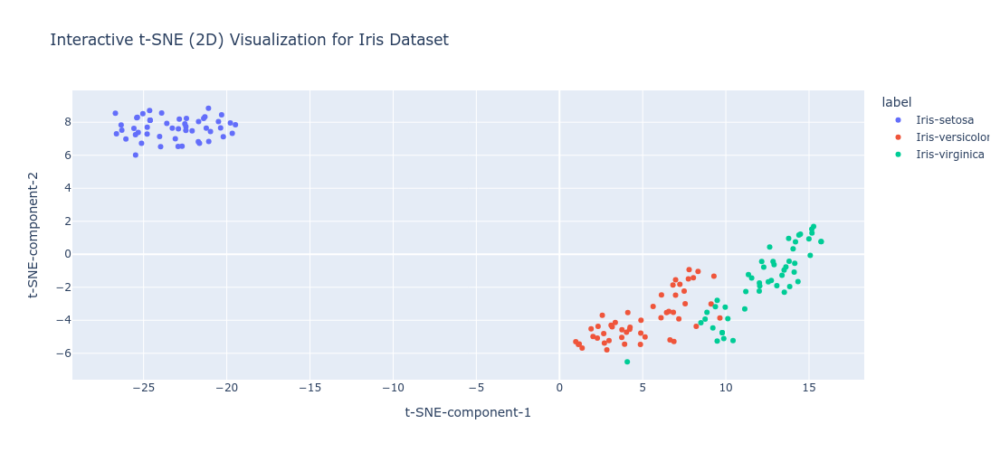

In [23]:
plot_interactive(method='t-SNE', n_components=2, df=iris_df, mdf=points,
                 features=iris_features, target='label', dataset_name='Iris')

## t-SNE (3D) Visualizations

In [24]:
points = get_mdf(method='t-SNE', n_components=3, df=iris_df, features=iris_features, target='label')
points['label'] = list(map(label_iris, iris_df.label))

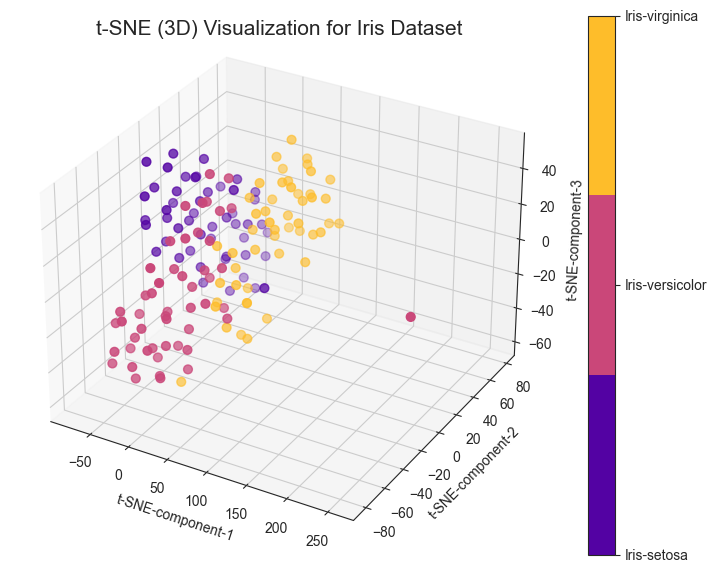

In [25]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes(projection='3d')

p = ax.scatter3D(points['t-SNE-component-1'],
             points['t-SNE-component-2'],
             points['t-SNE-component-3'], 
             c=points.label, cmap=LSCM.from_list("colormap", sns.color_palette('plasma'), N=3), s=40)

ax.set_title('t-SNE (3D) Visualization for Iris Dataset', fontsize=15, y=1.03)

ax.set_xlabel("t-SNE-component-1")
ax.set_ylabel("t-SNE-component-2")
ax.set_zlabel("t-SNE-component-3")

cbar = fig.colorbar(p)
cbar.set_ticklabels(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'])
cbar.set_ticks([0,1,2])
plt.show()

In [26]:
plot_interactive(method='t-SNE', n_components=3, df=iris_df, mdf=points,
                 features=iris_features, target='label', dataset_name='Iris')

---
# Wine Dataset
---

### Exploratory Data Analysis

In [27]:
wine_df = pd.read_csv('wine.csv')
wine_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4


In [28]:
wine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [29]:
try:
    wine_df.drop('Id', axis=1, inplace=True)
except Exception as e:
    print(e)

wine_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [30]:
wine_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [31]:
wine_df.nunique()

fixed acidity            91
volatile acidity        135
citric acid              77
residual sugar           80
chlorides               131
free sulfur dioxide      53
total sulfur dioxide    138
density                 388
pH                       87
sulphates                89
alcohol                  61
quality                   6
dtype: int64

In [32]:
wine_features = wine_df.columns.tolist()[:-1]

In [33]:
qd = wine_df.quality.value_counts().to_dict()
qk = list(qd.keys())
qk.sort()
qualityd = {each:qd[each] for each in qk}

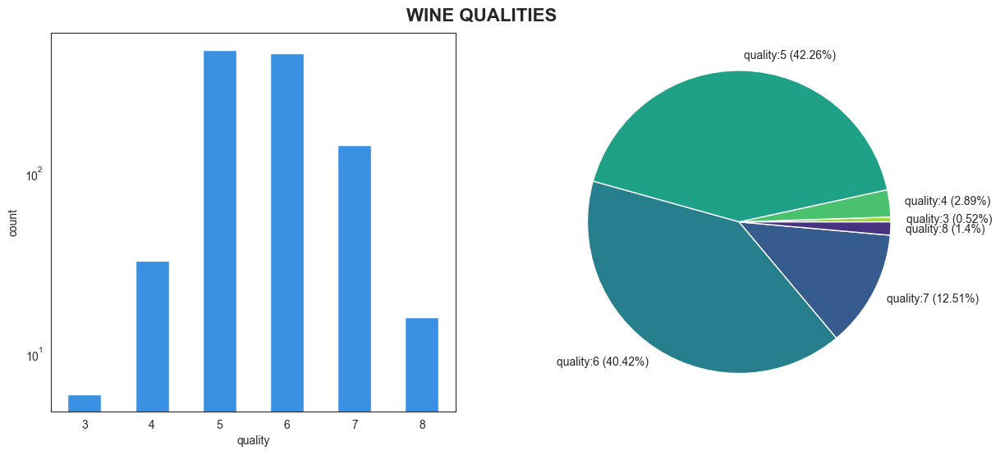

In [34]:
fig, ax = plt.subplots(1, 2, figsize=(14,6))
sns.countplot(x='quality', data=wine_df, color='dodgerblue', width=0.5, ax=ax[0])
pie_labels = [f'quality:{each} ({round(qualityd[each]/sum(qualityd.values())*100, 2)}%)' for each in qualityd.keys()]
ax[1].pie(qualityd.values(), labels=pie_labels, colors=sns.color_palette('viridis_r'))
ax[0].set_yscale('log')
fig.suptitle('wine qualities'.upper(), fontweight='bold', fontsize=16, y=0.93)
plt.show()

### Plotting all feature pairs

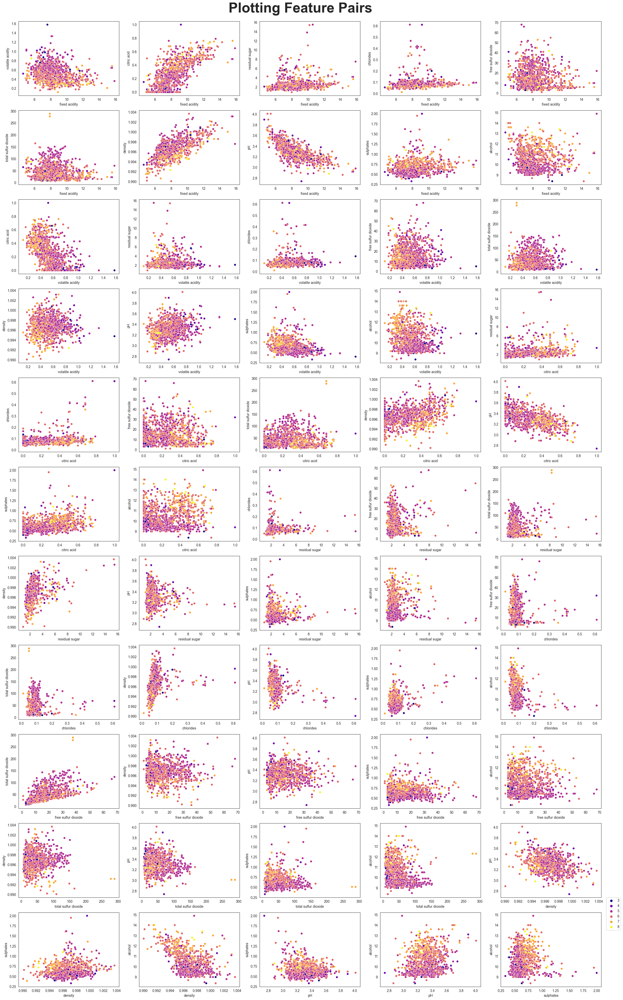

In [35]:
fig, ax = plt.subplots(11, 5, figsize=(30,50))

for idx, pair in enumerate(combinations(wine_features, 2)):
    sns.scatterplot(wine_df, x=pair[0], y=pair[1], hue='quality', palette='plasma', ax=ax[idx//5][idx%5], legend=True if idx==54 else False)
    if idx == 54:
        ax[idx//5][idx%5].legend(bbox_to_anchor=(1.05, 1.2), loc='upper left', borderaxespad=0)

fig.suptitle('Plotting Feature Pairs', fontsize=40, fontweight='bold', y=0.895)
fig.show()

## PCA (2D) Visualizations

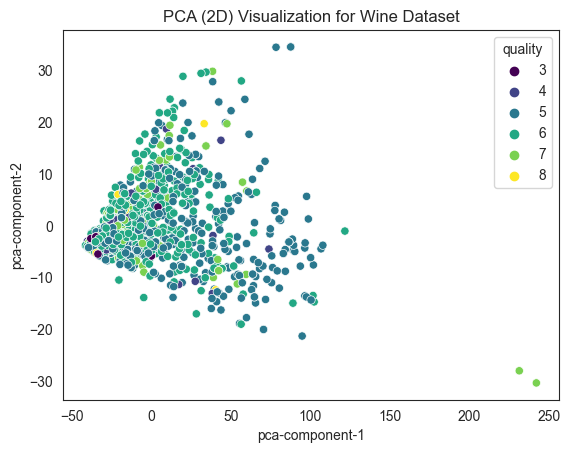

In [36]:
points = get_mdf(method='pca', n_components=2, df=wine_df, features=wine_features, target='quality')
plot_2d(method='pca', mdf=points, target='quality', dataset_name='Wine', palette='viridis')

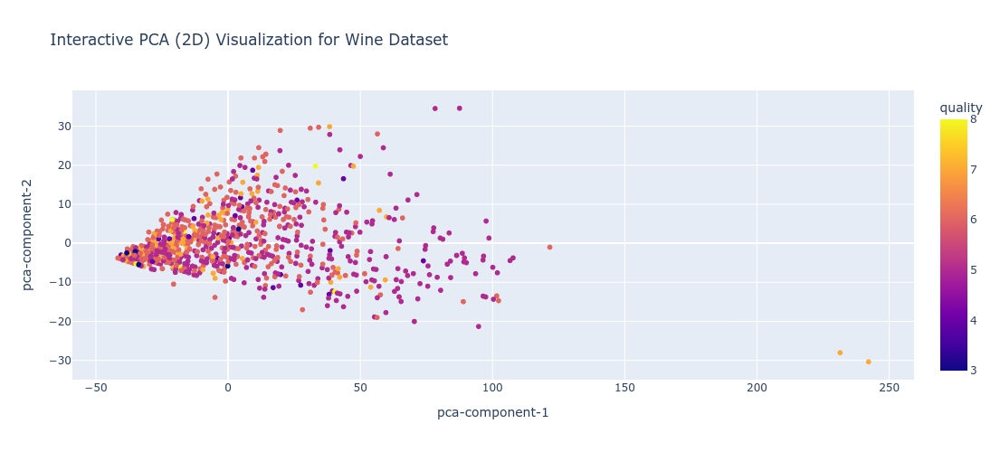

In [37]:
plot_interactive(method='pca', n_components=2, df=wine_df, mdf=points,
                 features=wine_features, target='quality', dataset_name='Wine')

## PCA (3D) Visualizations

In [38]:
points = get_mdf(method='pca', n_components=3, df=wine_df,
                 features=wine_features, target='quality')

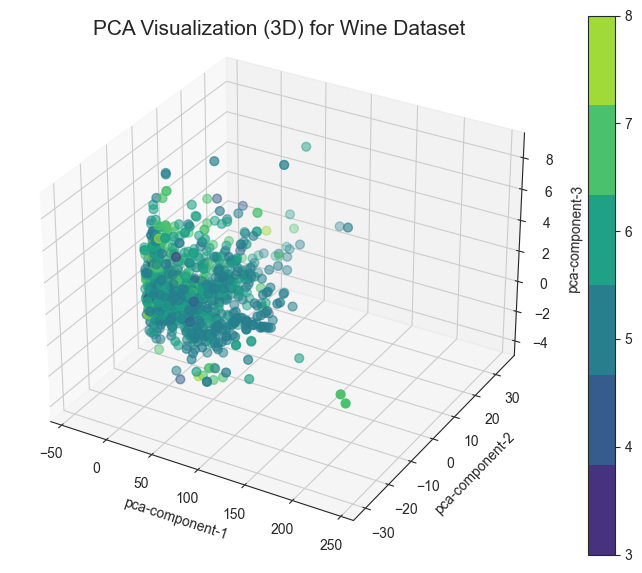

In [39]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes(projection='3d')

p = ax.scatter3D(points['pca-component-1'],
                 points['pca-component-2'],
                 points['pca-component-3'], 
                 c=points.quality,
                 cmap=LSCM.from_list("colormap", sns.color_palette('viridis'), N=6), s=40)

ax.set_title('PCA Visualization (3D) for Wine Dataset', fontsize=15, y=1.03)

ax.set_xlabel("pca-component-1")
ax.set_ylabel("pca-component-2")
ax.set_zlabel("pca-component-3")

cbar = fig.colorbar(p)
cbar.set_ticklabels([f'{each}' for each in range(3,8+1)])
plt.show()

In [40]:
plot_interactive(method='pca', n_components=3, df=wine_df, mdf=points,
                 features=wine_features, target='quality', dataset_name='Wine')

## t-SNE (2D) Visualizations

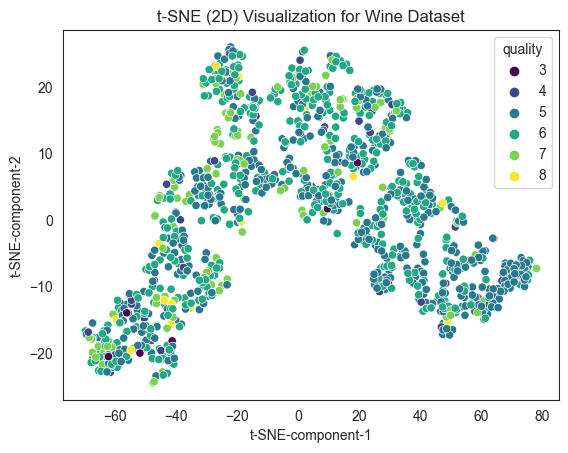

In [41]:
points = get_mdf(method='t-SNE', n_components=2, df=wine_df, features=wine_features, target='quality')
plot_2d(method='t-SNE', mdf=points, target='quality', dataset_name='Wine', palette='viridis')

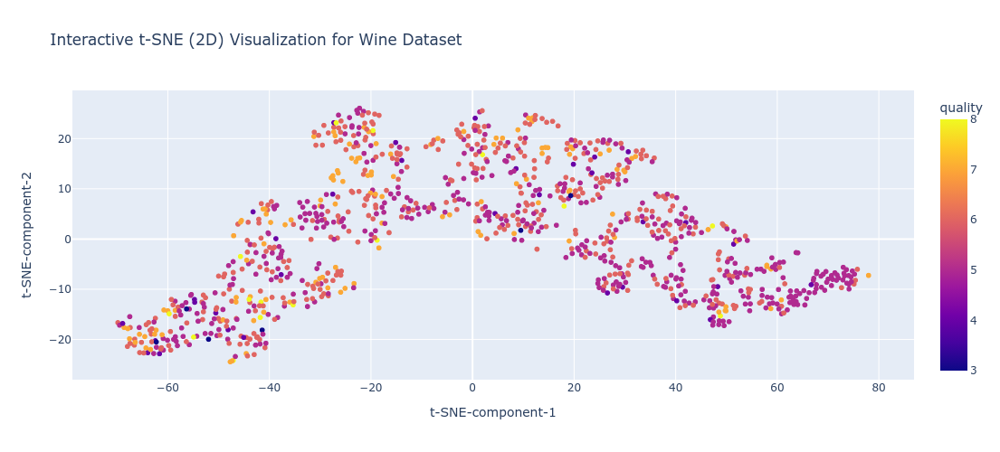

In [42]:
plot_interactive(method='t-SNE', n_components=2, df=wine_df, mdf=points,
                 features=wine_features, target='quality', dataset_name='Wine')

## t-SNE (3D) Visualizations

In [43]:
points = get_mdf(method='t-SNE', n_components=3, df=wine_df,
                 features=wine_features, target='quality')

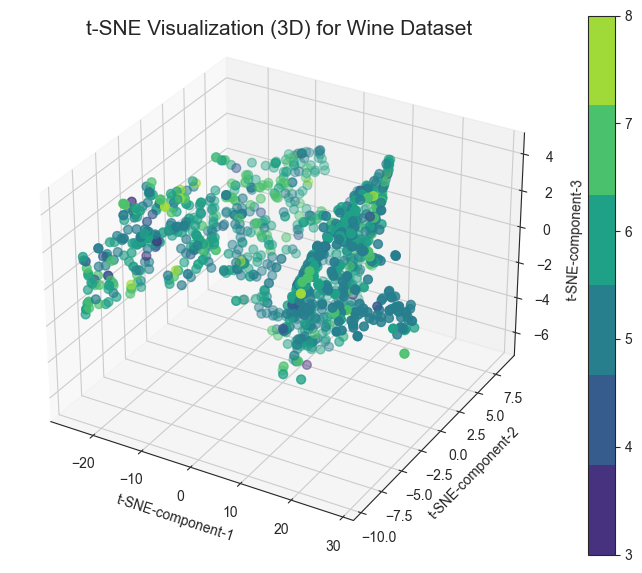

In [44]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes(projection='3d')

p = ax.scatter3D(points['t-SNE-component-1'],
                 points['t-SNE-component-2'],
                 points['t-SNE-component-3'], 
                 c=points.quality,
                 cmap=LSCM.from_list("colormap", sns.color_palette('viridis'), N=6), s=40)

ax.set_title('t-SNE Visualization (3D) for Wine Dataset', fontsize=15, y=1.03)

ax.set_xlabel("t-SNE-component-1")
ax.set_ylabel("t-SNE-component-2")
ax.set_zlabel("t-SNE-component-3")

cbar = fig.colorbar(p)
cbar.set_ticklabels([f'{each}' for each in range(3,8+1)])
plt.show()

In [45]:
plot_interactive(method='t-SNE', n_components=3, df=wine_df, mdf=points,
                 features=wine_features, target='quality', dataset_name='Wine')

---
## Categorizing the wine qualities to: **low, medium, & high** (due to the presence of several overlapping wine qualities)

In [46]:
def qualcat(x):
    if x < 5:
        return 'low'
    elif x > 6:
        return 'high'
    return 'medium'

In [47]:
cat_wine_df = wine_df.copy()
cat_wine_df['label'] = list(map(qualcat, wine_df.quality))
cat_wine_df.sample(7)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label
797,10.0,0.430,0.33,2.7,0.095,28.0,89.0,0.99840,3.22,0.68,10.0,5,medium
441,6.8,0.690,0.00,5.6,0.124,21.0,58.0,0.99970,3.46,0.72,10.2,5,medium
963,6.1,0.340,0.25,1.8,0.084,4.0,28.0,0.99464,3.36,0.44,10.1,5,medium
831,6.5,0.610,0.00,2.2,0.095,48.0,59.0,0.99541,3.61,0.70,11.5,6,medium
952,7.5,0.510,0.02,1.7,0.084,13.0,31.0,0.99538,3.36,0.54,10.5,6,medium
274,12.0,0.370,0.76,4.2,0.066,7.0,38.0,1.00040,3.22,0.60,13.0,7,high
185,7.0,0.975,0.04,2.0,0.087,12.0,67.0,0.99565,3.35,0.60,9.4,4,low


In [48]:
tempcatd = cat_wine_df.label.value_counts().to_dict()
catd = {}
for each in ['low', 'medium', 'high']:
    catd[each] = tempcatd[each]
catd

{'low': 39, 'medium': 945, 'high': 159}

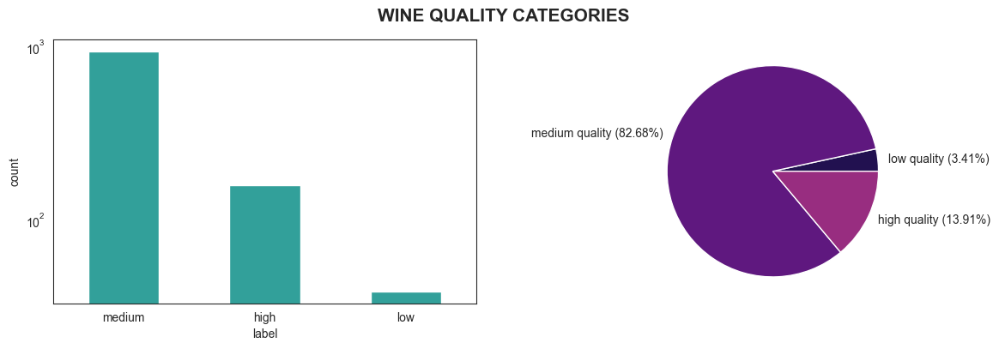

In [49]:
fig, ax = plt.subplots(1, 2, figsize=(14,4))
sns.countplot(x='label', data=cat_wine_df, color='lightseagreen', width=0.5, ax=ax[0])
pie_labels = [f'{each} quality ({round(catd[each]/sum(catd.values())*100, 2)}%)' for each in catd.keys()]
ax[1].pie(catd.values(), labels=pie_labels, colors=sns.color_palette('magma'))
ax[0].set_yscale('log')
fig.suptitle('wine quality categories'.upper(), fontweight='bold', fontsize=15, y=0.97)
plt.show()

### Plotting all feature pairs

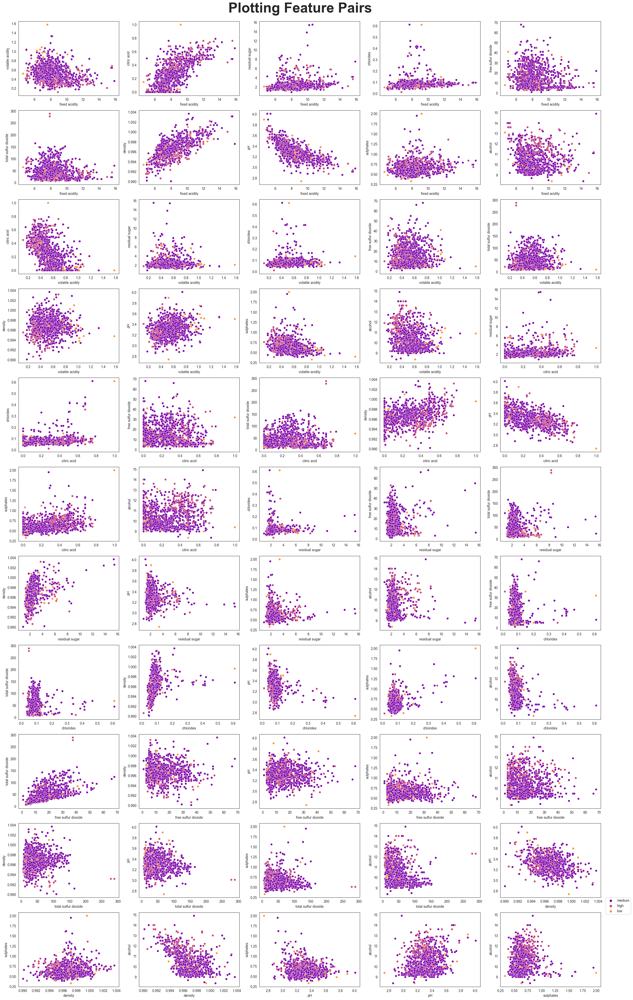

In [50]:
fig, ax = plt.subplots(11, 5, figsize=(30,50))

for idx, pair in enumerate(combinations(wine_features, 2)):
    sns.scatterplot(cat_wine_df, x=pair[0], y=pair[1], hue='label', palette='plasma', ax=ax[idx//5][idx%5], legend=True if idx==54 else False)
    if idx == 54:
        ax[idx//5][idx%5].legend(bbox_to_anchor=(1.05, 1.2), loc='upper left', borderaxespad=0)

fig.suptitle('Plotting Feature Pairs', fontsize=40, fontweight='bold', y=0.895)
fig.show()

In [51]:
def label_cat_wine(x):
    if x == 'low':
        return 0
    elif x == 'medium':
        return 1
    return 2

## PCA (2D) Visualizations

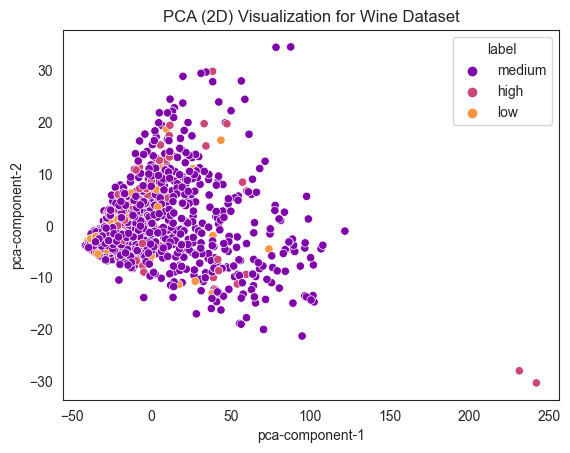

In [52]:
points = get_mdf(method='pca', n_components=2, df=cat_wine_df, features=wine_features, target='label')
plot_2d(method='pca', mdf=points, target='label', dataset_name='Wine', palette='plasma')

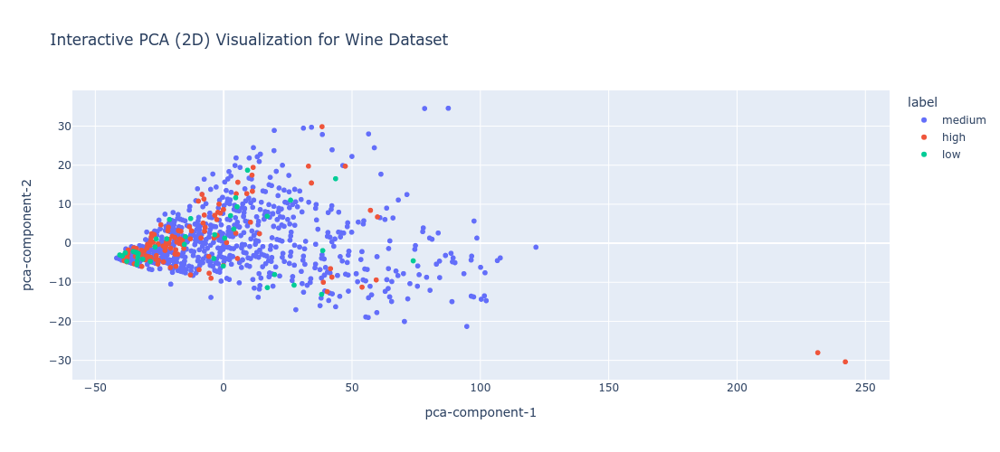

In [53]:
plot_interactive(method='pca', n_components=2, df=cat_wine_df, mdf=points,
                 features=wine_features+['quality'], target='label', dataset_name='Wine')

## PCA (3D) Visualizations

In [54]:
points = get_mdf(method='pca', n_components=3, df=cat_wine_df,
                 features=wine_features, target='label')
points['label'] = list(map(label_cat_wine, cat_wine_df.label))

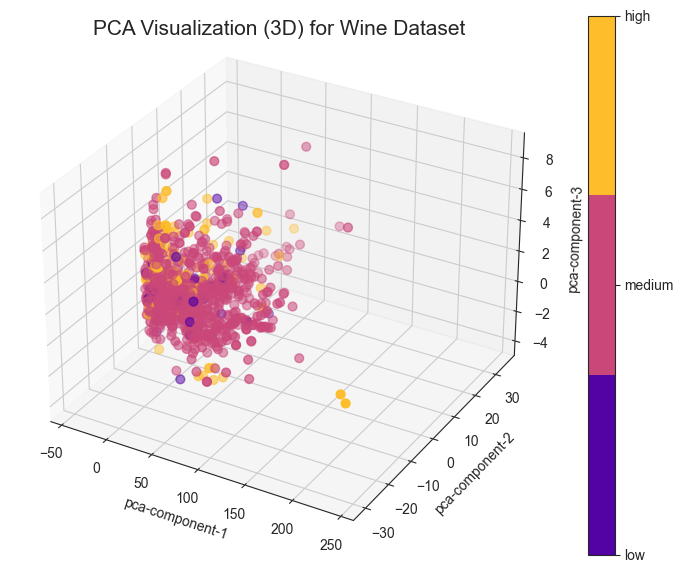

In [55]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes(projection='3d')

p = ax.scatter3D(points['pca-component-1'],
                 points['pca-component-2'],
                 points['pca-component-3'], 
                 c=points.label,
                 cmap=LSCM.from_list("colormap", sns.color_palette('plasma'), N=3), s=40)

ax.set_title('PCA Visualization (3D) for Wine Dataset', fontsize=15, y=1.03)

ax.set_xlabel("pca-component-1")
ax.set_ylabel("pca-component-2")
ax.set_zlabel("pca-component-3")

cbar = fig.colorbar(p)
cbar.set_ticklabels(['low', 'medium', 'high'])
cbar.set_ticks([0, 1, 2])
plt.show()

## t-SNE (2D) Visualizations

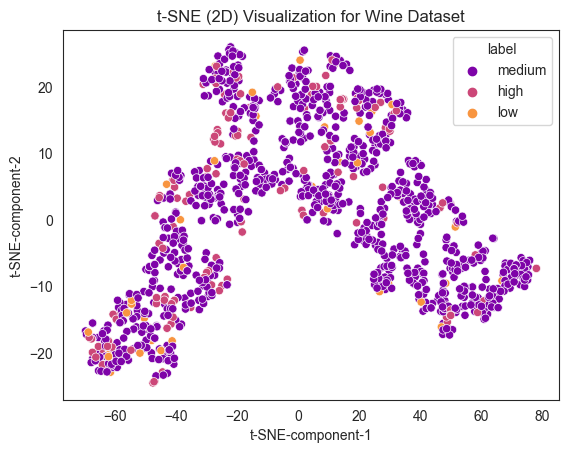

In [56]:
points = get_mdf(method='t-SNE', n_components=2, df=cat_wine_df,
                 features=wine_features, target='label')
plot_2d(method='t-SNE', mdf=points, target='label', dataset_name='Wine', palette='plasma')

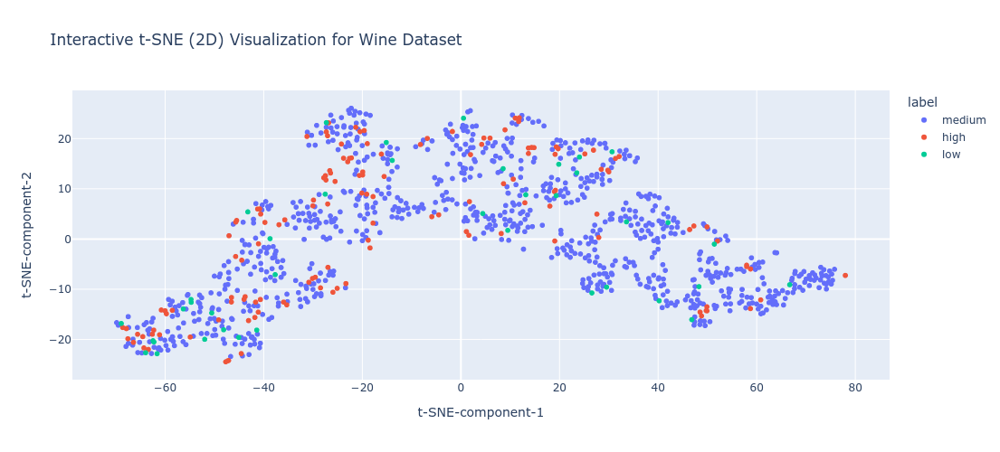

In [57]:
plot_interactive(method='t-SNE', n_components=2, df=cat_wine_df, mdf=points,
                 features=wine_features, target='label', dataset_name='Wine')

## t-SNE (3D) Visualizations

In [58]:
points = get_mdf(method='t-SNE', n_components=3, df=cat_wine_df,
                 features=wine_features, target='label')
points['label'] = list(map(label_cat_wine, cat_wine_df.label))

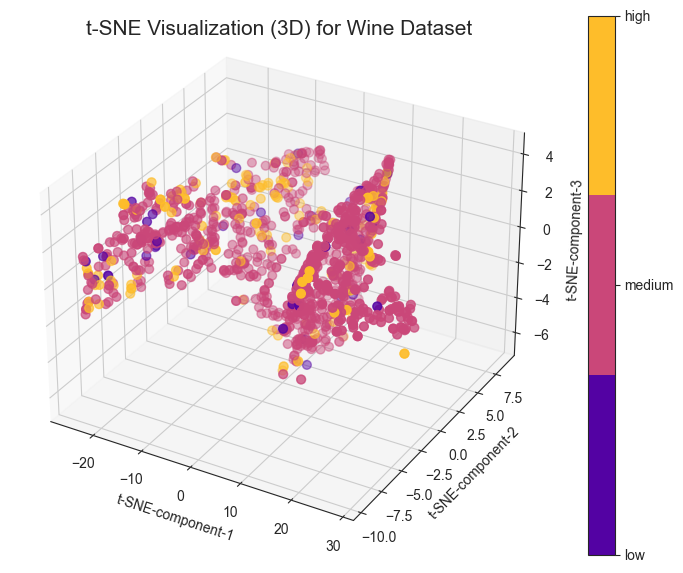

In [59]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes(projection='3d')

p = ax.scatter3D(points['t-SNE-component-1'],
                 points['t-SNE-component-2'],
                 points['t-SNE-component-3'], 
                 c=points.label,
                 cmap=LSCM.from_list("colormap", sns.color_palette('plasma'), N=3), s=40)

ax.set_title('t-SNE Visualization (3D) for Wine Dataset', fontsize=15, y=1.03)

ax.set_xlabel("t-SNE-component-1")
ax.set_ylabel("t-SNE-component-2")
ax.set_zlabel("t-SNE-component-3")

cbar = fig.colorbar(p)
cbar.set_ticklabels(['low', 'medium', 'high'])
cbar.set_ticks([0, 1, 2])
plt.show()

In [60]:
plot_interactive(method='t-SNE', n_components=3, df=cat_wine_df, mdf=points,
                 features=wine_features, target='label', dataset_name='Wine')

---